🐶 Using Transfer Learning and TensorFlow 2.0 to Classify Different Dog Breeds
This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.x and TensorFlow Hub.

## 1. Problem
  Identifying the breed of a dog given an image of a dog.

  When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data
  The data we're using is from Kaggle's dog breed identification competition.

    https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation
  The evaluation is a file with prediction probabilities for each dog breed of each test image.

    https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features
  Some information about the data:

  * We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
  * There are 120 breeds of dogs (this means there are 120 different classes).
  * There are around 10,000+ images in the training set (these images have labels).
  * There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

In [1]:
# Import TensorFlow
import tensorflow as tf
import tensorflow_hub as hub
print(tf.__version__)
print(hub.__version__)

# Check for GPU availability
print("GPU", "Success" if tf.config.list_physical_devices("GPU") else "Unsuccessful")

2.18.0
0.16.1
GPU Unsuccessful


In [2]:
# Getting out data ready into Tensors(Numerical Representation)
import pandas as pd
label_csv= pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
label_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [3]:
label_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,fff43b07992508bc822f33d8ffd902ae,scottish_deerhound
freq,1,126


<Axes: xlabel='breed'>

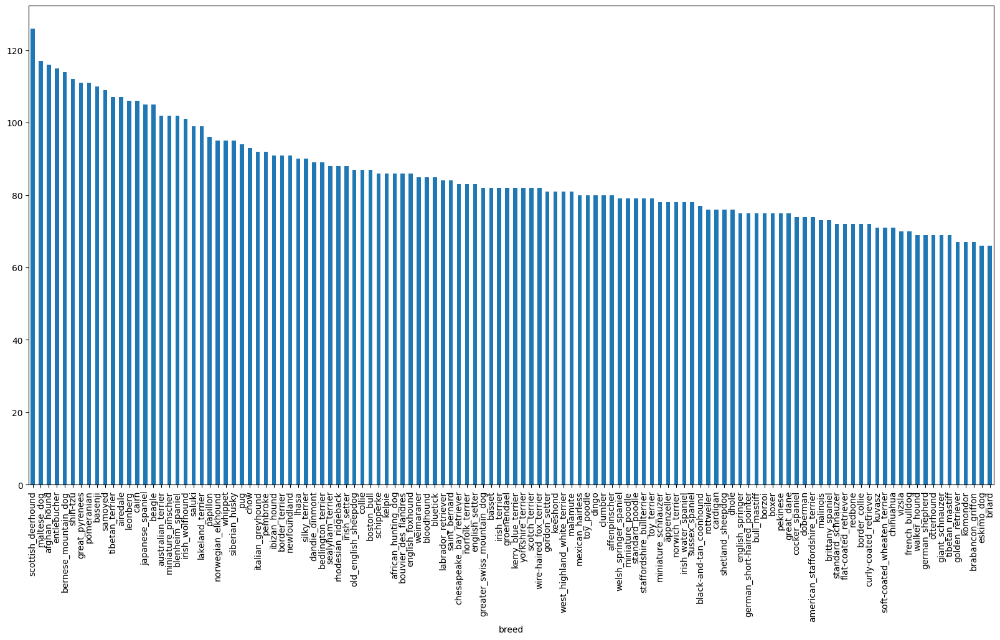

In [4]:
#How many images are there for each breed
label_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [5]:
label_csv["breed"].value_counts().median()

82.0

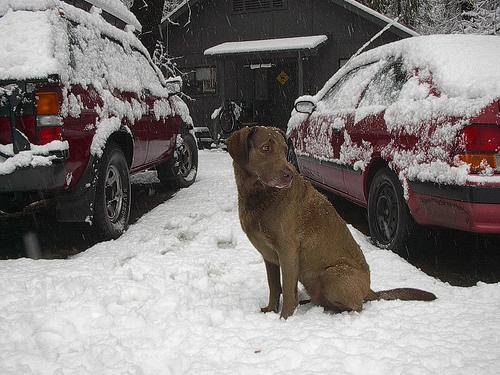

In [6]:
from IPython.display import Image
Image("/content/drive/MyDrive/Dog Vision/train/fff43b07992508bc822f33d8ffd902ae.jpg")

### Getting Images and label

In [7]:
#Create pathname from image ID's
filenames=["/content/drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in label_csv["id"]]

filenames

['/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 '/content/drive/MyDrive/Dog Vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 '/content/drive/MyDrive/Dog

In [8]:
#Check whether number of filesname mathes of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/Dog Vision/train/"))== len(filenames):
  print("Filenames match actual amount of files")

Filenames match actual amount of files


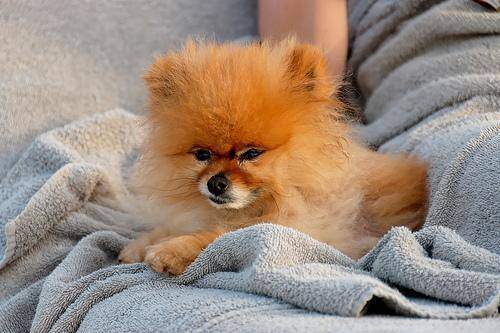

In [9]:
Image(filenames[8000])

In [10]:
label_csv["breed"][8000]

'pomeranian'

In [11]:
import numpy as np
labels =label_csv["breed"]
labels=np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [12]:
len(labels)

10222

In [13]:
#Check if number of labels matches the number of filenames
if len(labels)== len(filenames):
  print("Number of labels matches number of filenames")

Number of labels matches number of filenames


In [14]:
#Find the unique label values
unique_breeds =np.unique(labels)

In [15]:
len(unique_breeds)

120

In [16]:
#Turn label into boolean array
boolean_labels=[label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

### Creating our own Validation test

In [17]:
X= filenames
y=boolean_labels

In [18]:
#Set number of images to use for experimenting
NUM_IMAGES=1000 #@param {type:"slider",min:1000,max:10000,step:1000}

In [19]:

#Lets's split our data into train and validation sets
from sklearn.model_selection import train_test_split
#Split them into training and validation
X_train,X_val,y_train,y_val=train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=42)

len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

## Preprocessing images (Turning into Tensors)

In [20]:
# Convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [21]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [22]:
#Define image size
IMG_SIZE=224

#Create a function preprocessing images
def process_image(image_path,img_size=IMG_SIZE):
  """
  Takes an image file path and tuen the image intp Tensors
  """

  #Read in an image file
  image=tf.io.read_file(image_path)

  #Turn the jpeg image into numerical Tensor with 3 colour channels
  image = tf.image.decode_jpeg(image,channels=3)

  #Convert the colour channel values from 0-255 to 0-1 values
  image=tf.image.convert_image_dtype(image,tf.float32)

  #Resize the image (224,224)
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image

## Turning our data into Batches

In [23]:
#Create a simple function to return a tuple (image,label)
def get_image_label(image_path,label):
  image=process_image(image_path)
  return image,label

In [24]:
#Define the batch size 32
BATCH_SIZE=32

#Function to turn data into batches
def create_data_batches(X, y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't if it's validation data.
  Also accepts test data as input (no labels)
  """
  # If data ia a test dataset, we probably don't have labels
  if(test_data):
    print("Creating test batches.....")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch =data.map(process_image).batch(BATCH_SIZE)
    return data_batch

    # If data is Valid Dataset
  elif valid_data:
    print("Creating valid batches.....")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data_batch =data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

    #If data is Training Dataset
  else:
    print("Creating training batches.....")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    #Shuffling
    data= data.shuffle(buffer_size=len(X))
    data=data.map(get_image_label)
    data_batch=data.batch(BATCH_SIZE)
    return data_batch

In [25]:
#Create training and validation data batches
train_data=create_data_batches(X_train,y_train)
val_data=create_data_batches(X_val,y_val,valid_data=True)

Creating training batches.....
Creating valid batches.....


In [26]:
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches

In [27]:
import matplotlib.pyplot as plt
#Function to viewing images in data batch
def show_25_images(images,labels):
  """
  Displays 25 images from a data batch
  """
  #Setup the figure
  plt.figure(figsize=(10,10))
  #Loop through 25
  for i in range(25):
    #Create subplots (5 rows,5 columns)
    ax=plt.subplot(5,5,i+1)
    #Display image
    plt.imshow(images[i])
    #Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    #Turn the grid lines off
    plt.axis("off")

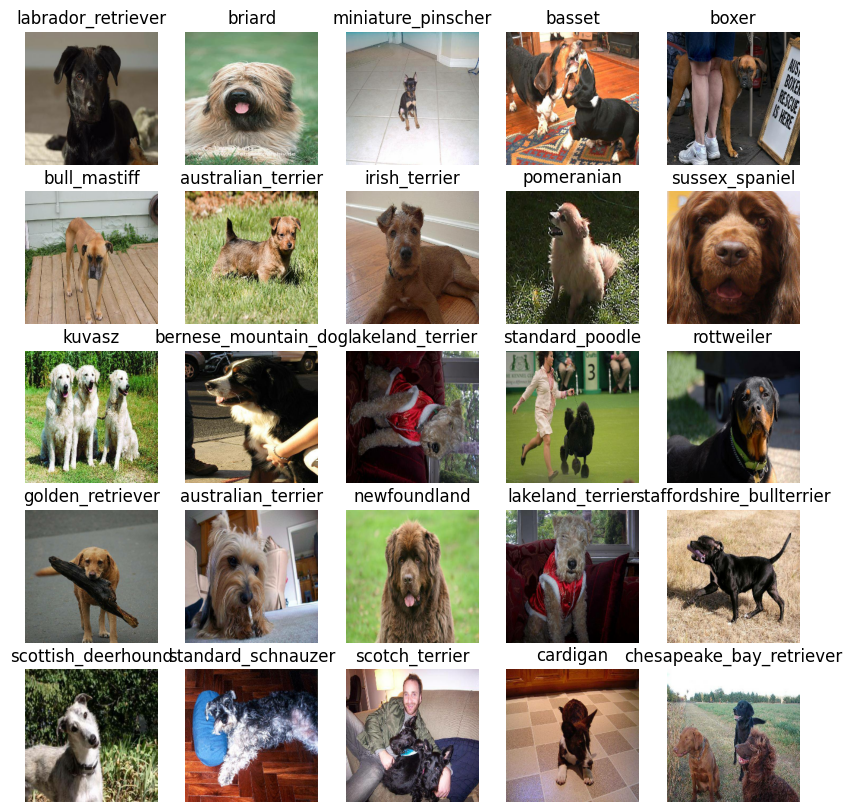

In [28]:
train_images,train_labels=next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

## Building a Model

## Keras deep learning Model

In [29]:
import tensorflow as tf
from tensorflow.keras import layers

# Custom Layer to wrap the inference function of the saved model
class TFSMLayer(layers.Layer):
    def __init__(self, saved_model_path, **kwargs):
        super(TFSMLayer, self).__init__(**kwargs)
        # Load the saved model in __init__
        self.saved_model = tf.saved_model.load(saved_model_path)
        # Get the inference function
        self.inference_fn = self.saved_model.signatures['serving_default']
        # Store the saved_model_path
        self.saved_model_path = saved_model_path

    def call(self, inputs):
        # Perform inference with the saved model and get the feature vector
        outputs = self.inference_fn(inputs)
        return outputs['feature_vector']  # Use 'feature_vector' based on the model's signature

    def get_config(self):
        # Return a configuration dictionary
        config = super(TFSMLayer, self).get_config()
        config.update({
            "saved_model_path": self.saved_model_path  # Use stored saved_model_path
        })
        return config


# Function for Keras model
def create_model(input_shape=(224, 224, 3), output_shape=1000, saved_model_path=None):
    print("Building model with saved model:", saved_model_path)

    # Setup the model layers
    model = tf.keras.Sequential([
        TFSMLayer(saved_model_path=saved_model_path),  # Pass saved_model_path to TFSMLayer
        layers.Dense(units=output_shape, activation="softmax")  # Classification layer
    ])

    # Compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )

    # Build the model with the input shape
    model.build((None, *input_shape))  # Batch size is None, input shape is (224, 224, 3)

    return model

# Define model parameters
SAVED_MODEL_PATH = "/content/drive/MyDrive/Dog Vision/models/mobilenet_v2"
OUTPUT_SHAPE = len(unique_breeds)

# Create and summarize the model
model = create_model(input_shape=(224, 224, 3), output_shape=OUTPUT_SHAPE, saved_model_path=SAVED_MODEL_PATH)
model.summary()

Building model with saved model: /content/drive/MyDrive/Dog Vision/models/mobilenet_v2


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ tfsm_layer (TFSMLayer)          │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 120)            │       153,720 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 153,720 (600.47 KB)

 Trainable params: 153,720 (600.47 KB)

 Non-trainable params: 0 (0.00 B)

## Creating Callbacks

In [30]:
# TensorBoard notebook extensions
%load_ext tensorboard

In [31]:

import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [32]:
#Create early stopping callbacks
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                    patience=3)

## **Training Model**

In [33]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [36]:
# Check to make sure we're still running on a GPU
print("GPU", "available (YES)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU not available :(


In [37]:
#Function to train the model
def train_model():
  """
Train a given model and returns trained version
  """
  model = create_model(input_shape=(224, 224, 3), output_shape=OUTPUT_SHAPE, saved_model_path=SAVED_MODEL_PATH)

  tensorboard= create_tensorboard_callback()

  #Fit the model to the data
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

In [ ]:
#Fit the model to the data
model = train_model()

Building model with saved model: /content/drive/MyDrive/Dog Vision/models/mobilenet_v2
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/callbacks/tensorboard.py:680: UserWarning: Model failed to serialize as JSON. Ignoring... '_UserObject' object has no attribute 'path'
  warnings.warn(f"Model failed to serialize as JSON. Ignoring... {exc}")


25/25 ━━━━━━━━━━━━━━━━━━━━ 138s 5s/step - accuracy: 0.0225 - loss: 5.0440 - val_accuracy: 0.1450 - val_loss: 4.0608
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 18s 708ms/step - accuracy: 0.4497 - loss: 2.7940 - val_accuracy: 0.3100 - val_loss: 3.1012
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 18s 614ms/step - accuracy: 0.8119 - loss: 1.4743 - val_accuracy: 0.3500 - val_loss: 2.7367
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 21s 621ms/step - accuracy: 0.9473 - loss: 0.9037 - val_accuracy: 0.4000 - val_loss: 2.5289
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 23s 709ms/step - accuracy: 0.9842 - loss: 0.5293 - val_accuracy: 0.4000 - val_loss: 2.4679
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 18s 606ms/step - accuracy: 0.9952 - loss: 0.3564 - val_accuracy: 0.4200 - val_loss: 2.4107
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 21s 636ms/step - accuracy: 1.0000 - loss: 0.2627 - val_accuracy: 0.4050 - val_loss: 2.3845
Epoch 8/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 15s 612ms/step - accuracy: 0.9994 - loss: 0.1984 - val_accuracy: 

# **Its's Overfitting**

In [ ]:
#Checking tensor board logs
%tensorboard --logdir "/content/drive/MyDrive/Dog Vision/logs"

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using trained model

In [38]:
#Make predictions on validation data
predictions = model.predict(val_data, verbose=1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 46s 6s/step


array([[0.00344347, 0.00286651, 0.00538974, ..., 0.00579109, 0.01072236,
        0.00269118],
       [0.01536852, 0.01122987, 0.00404102, ..., 0.01541696, 0.00569008,
        0.002561  ],
       [0.01484044, 0.01531659, 0.00130183, ..., 0.02045942, 0.02564898,
        0.00511522],
       ...,
       [0.00756428, 0.00832247, 0.00297461, ..., 0.00672791, 0.00642211,
        0.00895056],
       [0.00889906, 0.00525194, 0.00095969, ..., 0.01162991, 0.01072082,
        0.00261572],
       [0.01072977, 0.00306782, 0.00212762, ..., 0.015549  , 0.00689606,
        0.00568176]], dtype=float32)

In [39]:
np.sum(predictions[0])

np.float32(1.0)

In [40]:
predictions.shape

(200, 120)

In [41]:
#Find Predictions
index=42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[0.02268604 0.01163614 0.00507238 0.0087248  0.01560204 0.04154839
 0.01257681 0.0134072  0.00732468 0.00532596 0.00444543 0.00216474
 0.00502651 0.00389275 0.01050079 0.00431421 0.00933773 0.00638896
 0.0058471  0.00489431 0.00348065 0.00592304 0.00620872 0.00291782
 0.004154   0.01254326 0.00227289 0.00412135 0.00469354 0.00352787
 0.01432344 0.00264222 0.00493088 0.01130523 0.00533964 0.00957507
 0.0041383  0.00678668 0.00527178 0.00581949 0.02914155 0.00540045
 0.00944024 0.0024396  0.01616996 0.00333388 0.00668359 0.00693837
 0.00166598 0.03390153 0.02251221 0.00356126 0.00812398 0.00476506
 0.0059198  0.01698745 0.00579344 0.00844906 0.00501522 0.00812111
 0.01662102 0.01141578 0.01008591 0.00581408 0.00650464 0.00972156
 0.00807606 0.00361485 0.00263368 0.01168023 0.00986378 0.00436187
 0.00961284 0.01693457 0.01448655 0.00502084 0.0062524  0.00709174
 0.00803665 0.01036649 0.0064842  0.00324807 0.00471949 0.01547351
 0.00614143 0.01489572 0.00140982 0.00745675 0.00636005 0.0098

In [42]:
# Turn prediction probabilities into their respective label
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'appenzeller'

In [43]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [44]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [45]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

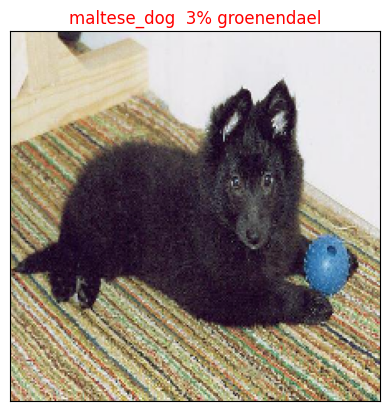

In [46]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=77)

In [47]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")

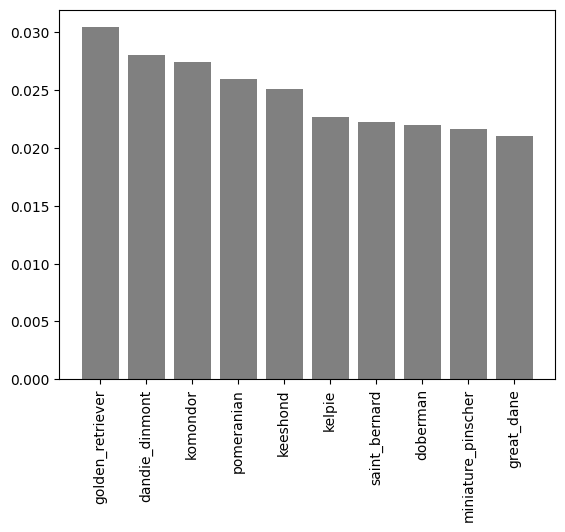

In [48]:
plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=7)

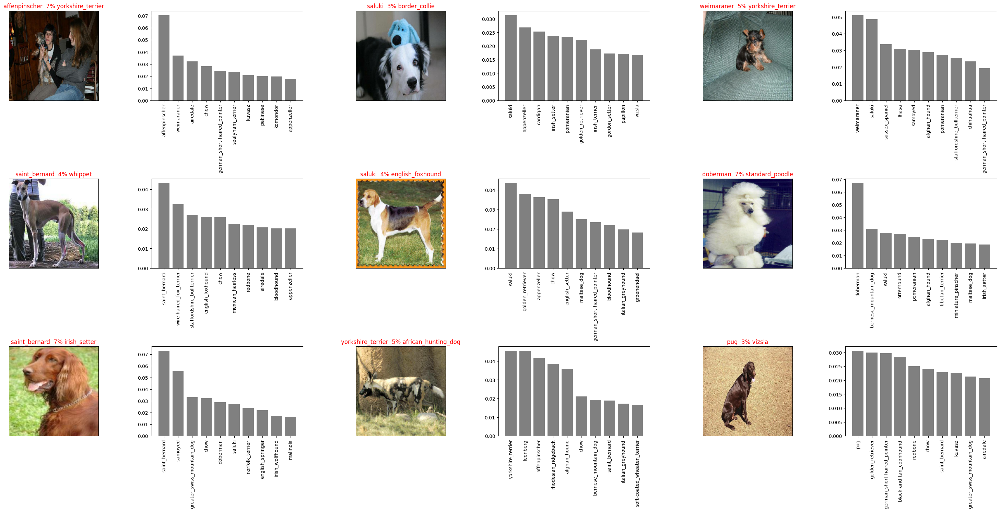

In [49]:
i_multiplier=10
num_rows=3
num_cols=3
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()


Saving and reloading a trained model

(confusion matrix is left)

In [50]:
#Create a function to save model
def save_model(model,suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [51]:
#Create a function to load trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"TFSMLayer": TFSMLayer}) # Add TFSMLayer to custom_objects
  return model

In [ ]:
save_model(model, suffix="1000-images-mobilenetv2")

Saving model to: /content/drive/MyDrive/Dog Vision/models/20250501-11101746097802-1000-images-mobilenetv2.h5...


'/content/drive/MyDrive/Dog Vision/models/20250501-11101746097802-1000-images-mobilenetv2.h5'

In [52]:
# Load a trained model
loaded_1000_image_model = load_model('/content/drive/MyDrive/Dog Vision/models/20250501-11101746097802-1000-images-mobilenetv2.h5')


Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20250501-11101746097802-1000-images-mobilenetv2.h5


In [53]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 426ms/step - accuracy: 0.0241 - loss: 5.1155


[5.1096906661987305, 0.029999999329447746]

In [54]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 443ms/step - accuracy: 0.0019 - loss: 5.1619


[5.1564531326293945, 0.004999999888241291]

### **Training a big dog model (on the full data)**

In [55]:
len(X), len(y)

(10222, 10222)

In [56]:
#Create a data batch
full_data=create_data_batches(X,y)

Creating training batches.....


In [57]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model(input_shape=(224, 224, 3), output_shape=OUTPUT_SHAPE, saved_model_path=SAVED_MODEL_PATH)

Building model with saved model: /content/drive/MyDrive/Dog Vision/models/mobilenet_v2


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 975s 3s/step - accuracy: 0.2951 - loss: 3.1390
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 172s 496ms/step - accuracy: 0.7088 - loss: 1.1032
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 205s 508ms/step - accuracy: 0.8001 - loss: 0.7727
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 159s 495ms/step - accuracy: 0.8559 - loss: 0.5800
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 193s 466ms/step - accuracy: 0.8966 - loss: 0.4568
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 217s 512ms/step - accuracy: 0.9293 - loss: 0.3625
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 214s 550ms/step - accuracy: 0.9519 - loss: 0.2899
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 200s 543ms/step - accuracy: 0.9712 - loss: 0.2255
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 192s 513ms/step - accuracy: 0.9840 - loss: 0.1830
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 201s 512ms/step - accuracy: 0.9914 - loss: 0.1448
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 163s 507ms/step - accuracy: 0.9955 - loss: 0.1227


In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2")

Saving model to: /content/drive/MyDrive/Dog Vision/models/20250501-12371746103042-full-image-set-mobilenetv2.h5...


'/content/drive/MyDrive/Dog Vision/models/20250501-12371746103042-full-image-set-mobilenetv2.h5'

In [58]:
# Load in the full model
loaded_full_model = load_model('/content/drive/MyDrive/Dog Vision/models/20250501-12371746103042-full-image-set-mobilenetv2.h5')

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20250501-12371746103042-full-image-set-mobilenetv2.h5


# **Making predictions on the test dataset**

In [66]:
#Load test image filenames
test_path= "/content/drive/MyDrive/Dog Vision/test/"
test_filenames=[test_path+fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog Vision/test/e3dd8fc9162f726122ca4cc783114c81.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e440ec011c3c7ea94838ab5fc466159c.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e425ab04e3a0d4464cda46a076964770.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e46a2bfb7816324d171c4e07786abc59.jpg',
 '/content/drive/MyDrive/Dog Vision/test/df4b040b13c5f514d215ba7c0813eaf8.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e487437a727b3e4f0b919c878d39ae6e.jpg',
 '/content/drive/MyDrive/Dog Vision/test/de90fcd52b9c527ea097d88804985516.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e12e6997c15c233c7b92209e08ff9d14.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e145bbebb9ad1e740256e460899a6b67.jpg',
 '/content/drive/MyDrive/Dog Vision/test/ddfb44a70822741297344d0a9ea81f2d.jpg']

In [67]:
len(test_filenames)

10357

In [68]:
#Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test batches.....


In [69]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [70]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 ━━━━━━━━━━━━━━━━━━━━ 573s 2s/step


In [72]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/My Drive/Dog Vision/preds_array.csv",test_predictions, delimiter=",")

In [73]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("/content/drive/MyDrive/Dog Vision/preds_array.csv", delimiter=",")

In [74]:
# Check out the test predictions
test_predictions[:10]

array([[5.45158692e-08, 5.37375718e-06, 7.65181646e-13, ...,
        3.16048321e-09, 9.60549507e-09, 1.78804176e-11],
       [9.43439840e-11, 2.10488588e-11, 4.38622923e-12, ...,
        3.63208839e-13, 3.52270071e-08, 7.68819643e-12],
       [1.37881813e-07, 1.66408613e-01, 1.91965022e-09, ...,
        2.49431578e-05, 2.99806979e-05, 8.40970606e-05],
       ...,
       [3.68010518e-07, 4.22324664e-09, 4.02955802e-09, ...,
        1.51679891e-09, 9.93844537e-07, 2.00322620e-06],
       [8.21251094e-14, 1.56480792e-06, 2.87283503e-10, ...,
        5.58196772e-13, 3.52658522e-13, 9.95804047e-12],
       [1.17600507e-06, 4.79422888e-04, 1.21082178e-09, ...,
        1.30358312e-05, 9.39757004e-03, 1.79881411e-07]])

In [75]:
test_predictions.shape

(10357, 120)

## **Preparing test dataset predictions for Kaggle**

In [76]:
#Create a pandas DataFrame
preds_df=pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [77]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [78]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e3dd8fc9162f726122ca4cc783114c81,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e440ec011c3c7ea94838ab5fc466159c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e425ab04e3a0d4464cda46a076964770,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e46a2bfb7816324d171c4e07786abc59,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,df4b040b13c5f514d215ba7c0813eaf8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [79]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e3dd8fc9162f726122ca4cc783114c81,5.451587e-08,5.373757e-06,7.651816e-13,1.450103e-08,2.420470e-12,2.664438e-11,1.830118e-08,3.010120e-14,7.185607e-14,...,6.242261e-07,3.261004e-11,3.762924e-12,4.309016e-12,1.054816e-09,1.350145e-11,2.802261e-09,3.160483e-09,9.605495e-09,1.788042e-11
1,e440ec011c3c7ea94838ab5fc466159c,9.434398e-11,2.104886e-11,4.386229e-12,6.454883e-10,1.474005e-16,2.558451e-15,2.824845e-10,1.006246e-13,4.149495e-13,...,1.367269e-03,1.418529e-09,2.260608e-12,4.192633e-15,1.464526e-11,1.149727e-12,2.064093e-06,3.632088e-13,3.522701e-08,7.688196e-12
2,e425ab04e3a0d4464cda46a076964770,1.378818e-07,1.664086e-01,1.919650e-09,8.368184e-05,2.160239e-10,2.958833e-08,2.724929e-06,6.658163e-08,3.815333e-07,...,1.659916e-05,4.641803e-08,1.190356e-06,8.790568e-08,8.018469e-07,1.151502e-05,7.765103e-06,2.494316e-05,2.998070e-05,8.409706e-05
3,e46a2bfb7816324d171c4e07786abc59,1.225019e-17,1.276048e-13,8.720450e-18,3.876934e-09,1.078655e-14,1.071753e-19,1.602058e-14,1.816794e-14,4.598307e-15,...,6.782641e-06,3.554586e-14,1.104384e-13,4.704554e-14,1.570091e-11,1.442909e-15,1.193416e-07,1.980114e-13,2.020019e-06,1.086774e-16
4,df4b040b13c5f514d215ba7c0813eaf8,1.361200e-07,4.304631e-07,8.433078e-12,1.043033e-09,4.234098e-06,2.819875e-10,3.983002e-07,1.224907e-09,4.598149e-08,...,3.345694e-06,2.663051e-09,3.220585e-08,4.320079e-12,7.519021e-08,1.881634e-09,1.858307e-05,7.672415e-09,8.329979e-09,6.646978e-04


In [80]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/My Drive/Dog Vision/Complete_model_prediction.csv",
                index=False)

## **Making predictions on custom images**

In [94]:
# Get custom image filepaths
custom_path = "/content/drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [95]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test batches.....


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [96]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


In [97]:
custom_preds.shape

(2, 120)

In [98]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['rottweiler', 'labrador_retriever']

In [99]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

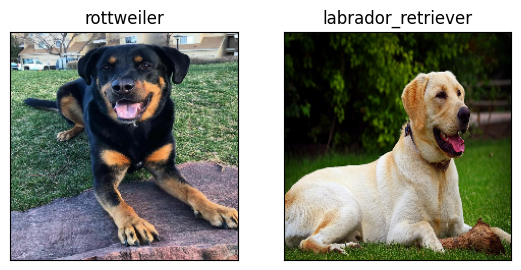

In [100]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)